In [2]:
import numpy as np
import cupy as cp
import os
import sys
from misc.operator import HelmholtzForwardOperator2D

from scipy.linalg import svd
from scipy.special import jn_zeros
import matplotlib.pyplot as plt
import matplotlib.tri as mtri

In [3]:
op = HelmholtzForwardOperator2D()

# Create mesh on disk of radius R0=1
R0 = 0.99
R = 1.0
Bz = 3
N_b = 250
theta = 2*np.pi

k_min = 5*np.pi/R
k_max = 25*np.pi/R
N_k = 20
k_vals = np.linspace(k_min,k_max,N_k)
#k_vals = jn_zeros(Bz, N_k) / R0
h = 0.04

# Boundary points
pts, tri = op.create_mesh(R0=R0, h=h)
bp = op.boundary_points(N_b=N_b, R=R, theta=theta)

In [52]:
op = HelmholtzForwardOperator2D()

# Create mesh on disk of radius R0=1
R0 = 0.99
R = 1.0
Bz = 3
N_b = 250
theta = 2*np.pi

N_k = 40
#k_vals = np.linspace(k_min,k_max,N_k)
k_vals = jn_zeros(Bz, N_k) / R0
h = 0.04

# Boundary points
pts, tri = op.create_mesh(R0=R0, h=h)
bp = op.boundary_points(N_b=N_b, R=R, theta=theta)

# Assemble matrix F

# If parameters are chosen so that the matrix has more columns than rows, then the problem will be invertible for sensible choises of k and and N_k

In [53]:
import numpy as np

def test_func(x, y, R, A, c1, c2):
    """
    Python equivalent of the given MATLAB function.
    Works with scalars or NumPy arrays.
    """
    x = np.asarray(x)
    y = np.asarray(y)

    f = np.zeros_like(x, dtype=float)
    r = np.sqrt((x - c1)**2 + (y - c2)**2)

    mask = r <= R
    f[mask] = A * np.exp(-1.0 / (R - r[mask]))

    return f.astype(np.complex64)


def block_func(x, y, x_tl, y_tl, x_br, y_br, value):
    """
    Constant block function.

    Parameters
    ----------
    x, y : array-like or scalars
        Coordinates where the function is evaluated.
    x_tl, y_tl : float
        Top-left corner of the box.
    x_br, y_br : float
        Bottom-right corner of the box.
    value : float
        Constant value inside the box.

    Returns
    -------
    f : ndarray or float
        Function value(s), zero outside the box.
    """
    x = np.asarray(x)
    y = np.asarray(y)

    f = np.zeros_like(x, dtype=float)

    mask = (
        (x >= x_tl) & (x <= x_br) &
        (y <= y_tl) & (y >= y_br)
    )

    f[mask] = value
    return f.astype(np.complex64)


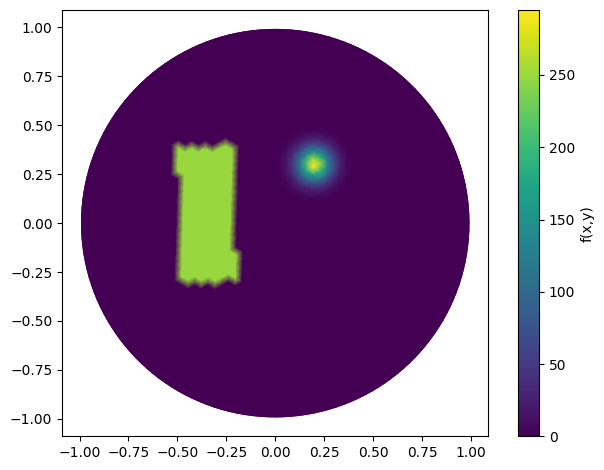

In [54]:
x = test_func(pts[:,0], pts[:,1], 0.3, 10000, 0.2, 0.3) + 500*block_func(pts[:,0], pts[:,1], -0.5,0.4,-0.2,-0.3,0.5)
x_cp = cp.asarray(x)

triang = mtri.Triangulation(pts[:, 0], pts[:, 1], tri)

plt.figure()
plt.tripcolor(triang, np.real(x), shading="gouraud", cmap="viridis")
plt.colorbar(label="f(x,y)")
plt.gca().set_aspect("equal")
plt.tight_layout()
plt.show()


In [55]:
print(x.shape)

(4541,)


In [56]:
k = k_vals[-1]
F_list = []
for i_k in range(N_k):
    k = k_vals[i_k]
    F_k = op.assemble_F(bp, k)
    F_list.append(F_k)

F = np.concatenate(F_list,axis=0).astype(np.complex64)
#F = np.random.rand(1000,x.shape[0])
F_cp = cp.asarray(F)
y_cp = F_cp @ x_cp
print(F_cp.shape)

(10000, 4541)


In [57]:
U_cp, S_cp, Vh_cp = cp.linalg.svd(F_cp, full_matrices=False)
U = cp.asnumpy(U_cp)
S = cp.asnumpy(S_cp)
Vh = cp.asnumpy(Vh_cp)

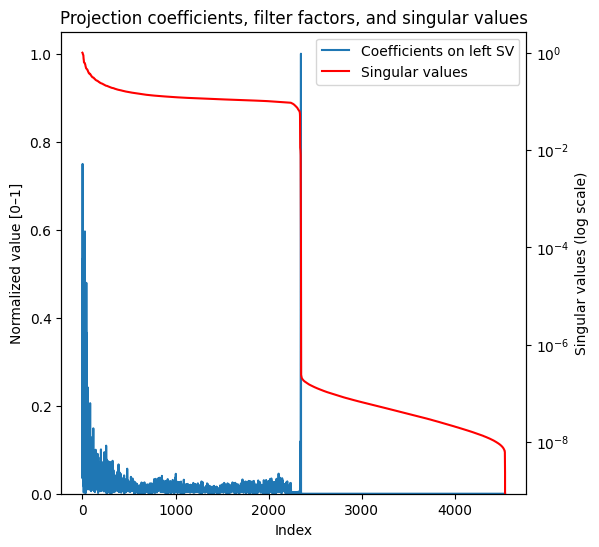

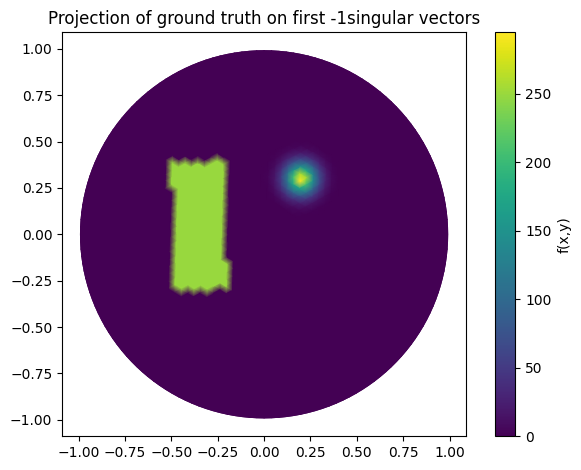

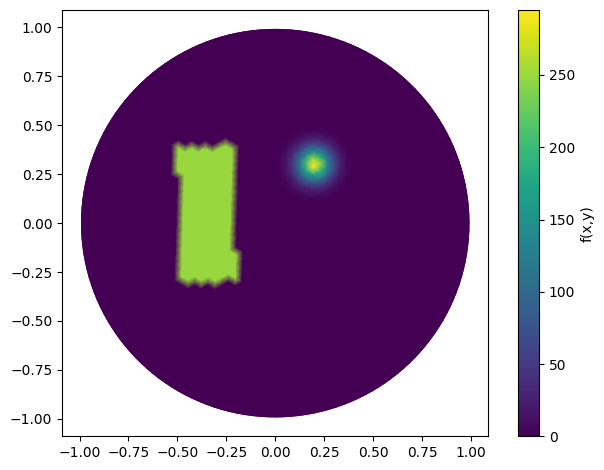

In [58]:
abs_coeffs = np.abs((Vh_cp @ x_cp).get())
abs_coeffs = abs_coeffs / np.max(abs_coeffs)


fig, ax1 = plt.subplots(figsize=(6,6))

# left axis: coefficients + filter
ax1.plot(abs_coeffs, label="Coefficients on left SV")

ax1.set_ylabel("Normalized value [0–1]")
ax1.set_ylim(0, 1.05)

# right axis: singular values (log scale)
ax2 = ax1.twinx()
ax2.semilogy(S / S.max(), color="red", label="Singular values")
ax2.set_ylabel("Singular values (log scale)")

# combine legends
lines1, labels1 = ax1.get_legend_handles_labels()
lines2, labels2 = ax2.get_legend_handles_labels()
ax1.legend(lines1 + lines2, labels1 + labels2)

ax1.set_title("Projection coefficients, filter factors, and singular values")
ax1.set_xlabel("Index")

plt.show()


N_vec = -1
x_proj = ((Vh_cp[:N_vec].T.conj())@((Vh_cp[:N_vec]@x_cp))).get()
plt.figure()
plt.tripcolor(triang, np.abs(x_proj), shading="gouraud", cmap="viridis")
plt.colorbar(label="f(x,y)")
plt.title('Projection of ground truth on first '+ str(N_vec)+ 'singular vectors')
plt.gca().set_aspect("equal")
plt.tight_layout()
plt.show()


plt.figure()
plt.tripcolor(triang, np.abs(x), shading="gouraud", cmap="viridis")
plt.colorbar(label="f(x,y)")
plt.gca().set_aspect("equal")
plt.tight_layout()
plt.show()

In [91]:
import cupy as cp

def svd_tikhonov_reconstruct(F_cp=None,
                            y_cp=None,
                            alpha=None,
                            tau=None,
                            U_cp=None,
                            S_cp=None,
                            Vh_cp=None):
    """
    Either provide F_cp (matrix) OR provide (U_cp, S_cp, Vh_cp).
    """

    if F_cp is not None:
        U, S, Vh = cp.linalg.svd(F_cp, full_matrices=False)
    else:
        if U_cp is None or S_cp is None or Vh_cp is None:
            raise ValueError("Provide either F_cp or (U_cp, S_cp, Vh_cp).")
        U, S, Vh = U_cp, S_cp, Vh_cp

    Uy = U.T.conj() @ y_cp

    # Spectral Tikhonov filter
    filt = S / (S**2 + alpha * (np.sqrt(alpha) / (S))**tau)

    Uy_filt = filt[:, None] * Uy if Uy.ndim == 2 else filt * Uy
    x_rec_cp = Vh.T.conj() @ Uy_filt

    return x_rec_cp, filt



def svd_tsvd_reconstruct(F_cp=None,
                         y_cp=None,
                         cutoff=None,
                         U_cp=None,
                         S_cp=None,
                         Vh_cp=None):
    """
    Either provide F_cp OR provide (U_cp, S_cp, Vh_cp).
    """

    if F_cp is not None:
        U, S, Vh = cp.linalg.svd(F_cp, full_matrices=False)
    else:
        if U_cp is None or S_cp is None or Vh_cp is None:
            raise ValueError("Provide either F_cp or (U_cp, S_cp, Vh_cp).")
        U, S, Vh = U_cp, S_cp, Vh_cp

    # apply cutoff
    Uc = U[:, :cutoff]
    Vhc = Vh[:cutoff]
    Sc = S[:cutoff]

    Uy = Uc.T.conj() @ y_cp

    filt = 1 / Sc
    Uy_filt = filt[:, None] * Uy if Uy.ndim == 2 else filt * Uy

    x_rec_cp = Vhc.T.conj() @ Uy_filt

    return x_rec_cp, (Uc, Sc, Vhc)



bandwidth=[2200, 2350, -2], cutoff=[np.float32(0.0036206874), np.float32(8.941955e-09), np.float32(8.8730974e-11)], alpha=[np.float32(0.060172148), np.float32(9.456191e-05), np.float32(9.419712e-06)]


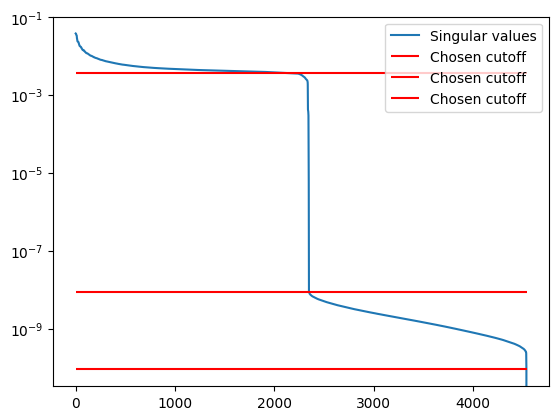

In [102]:
plt.semilogy(S, label='Singular values')

bandwidths = [2200, 2350, -2]
cutoffs = []
alphas = []
for i_bandwidth in range(len(bandwidths)):
    cutoffs.append(S[bandwidths[i_bandwidth]])
    alphas.append(np.sqrt(cutoffs[i_bandwidth]))
print(f"bandwidth={bandwidths}, cutoff={cutoffs}, alpha={alphas}")

for i_bandwidth in range(len(bandwidths)):
    plt.hlines(cutoffs[i_bandwidth], xmin=0, xmax = len(S), color='red', label = 'Chosen cutoff')
plt.legend()

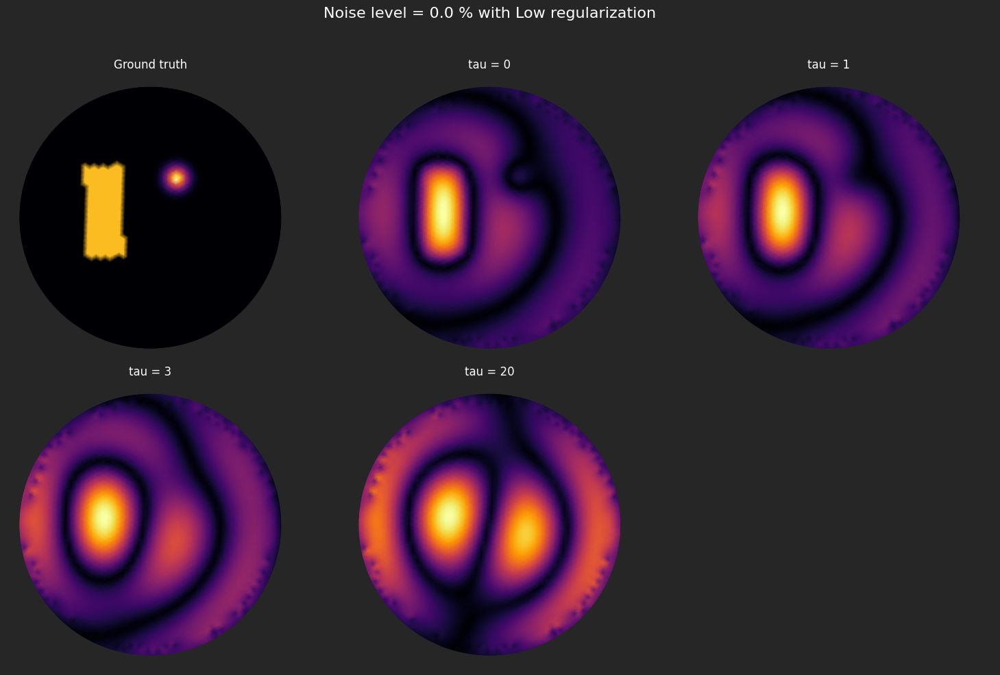

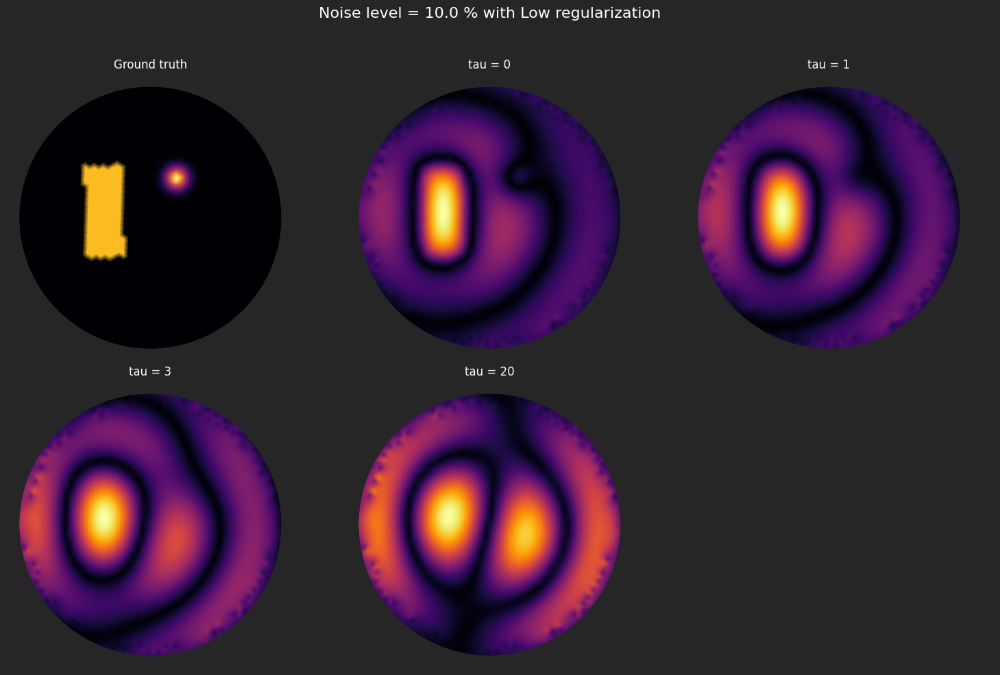

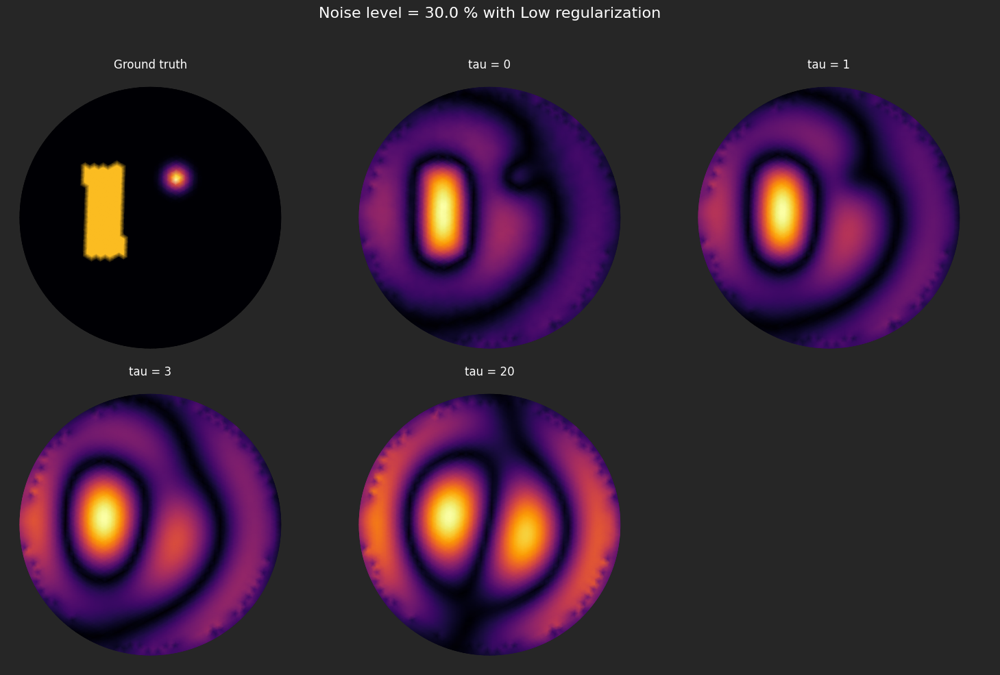

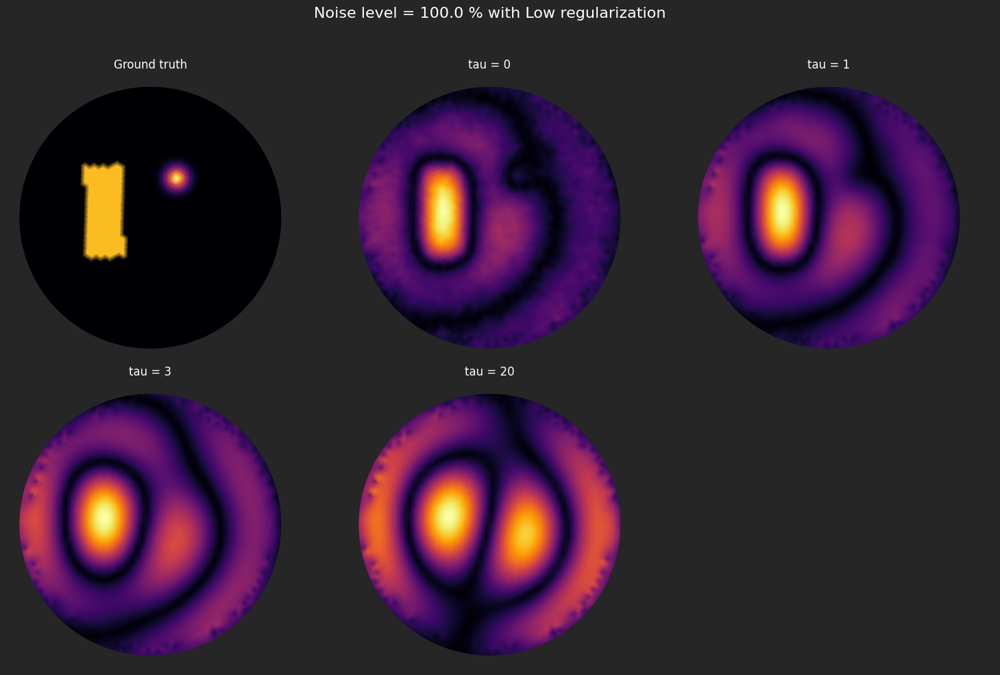

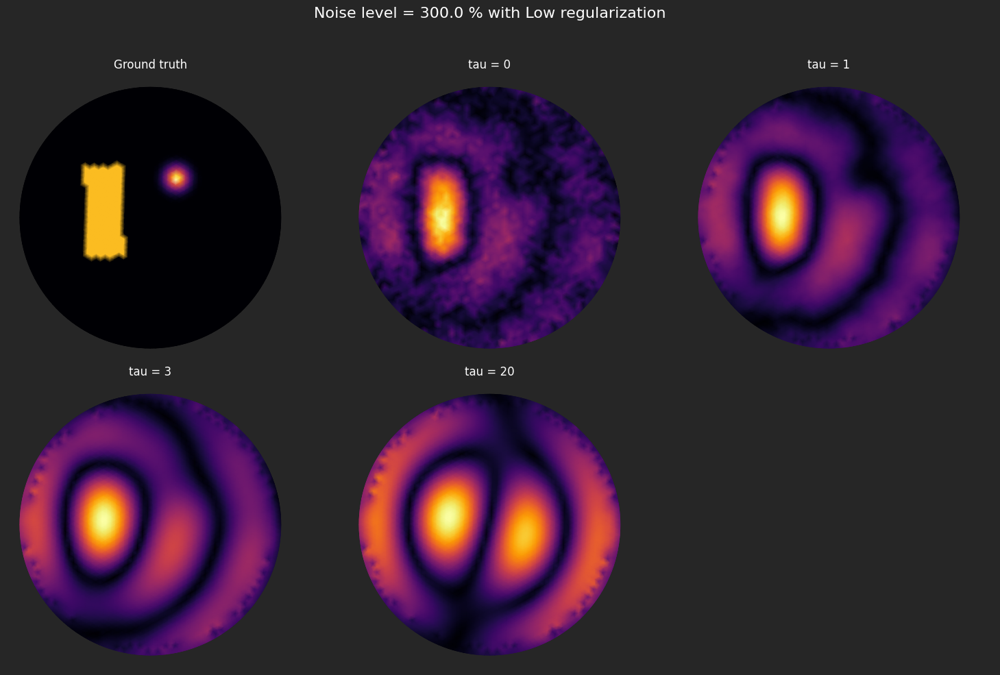

...

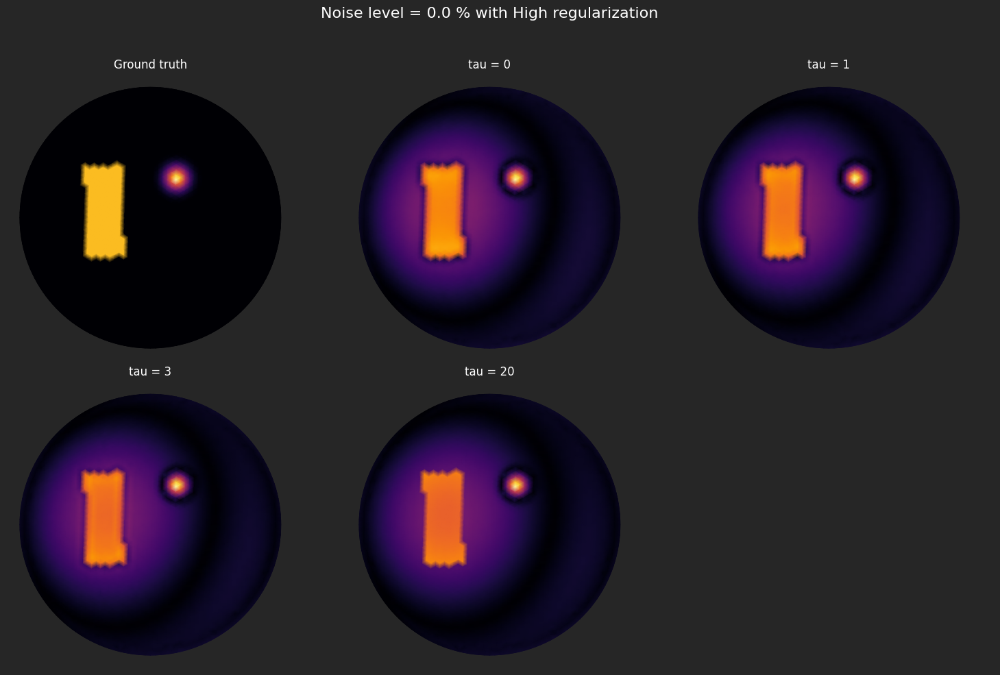

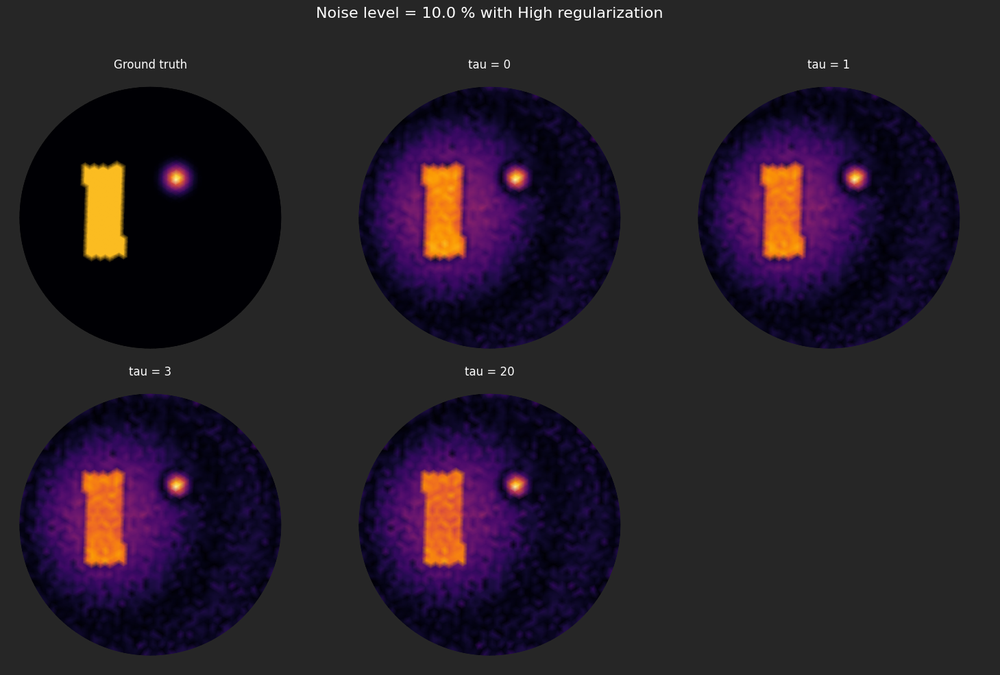

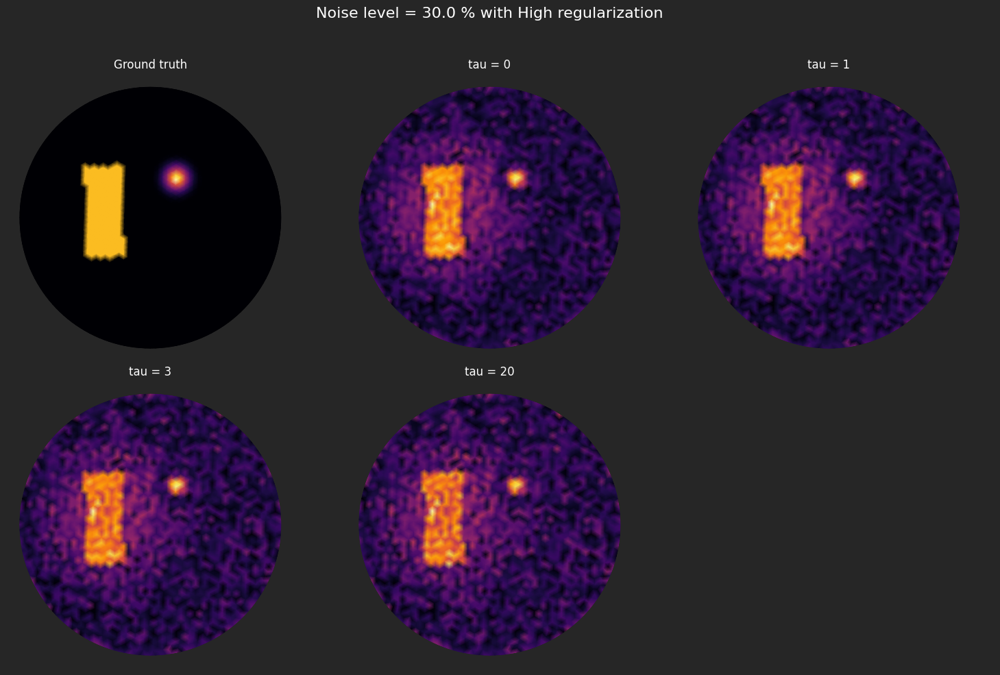

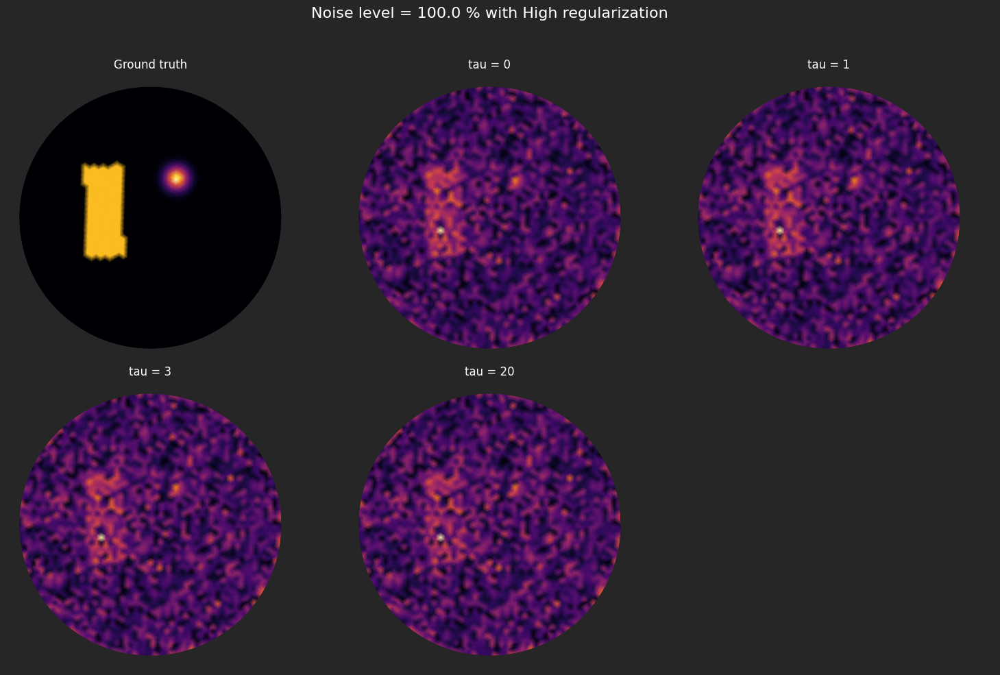

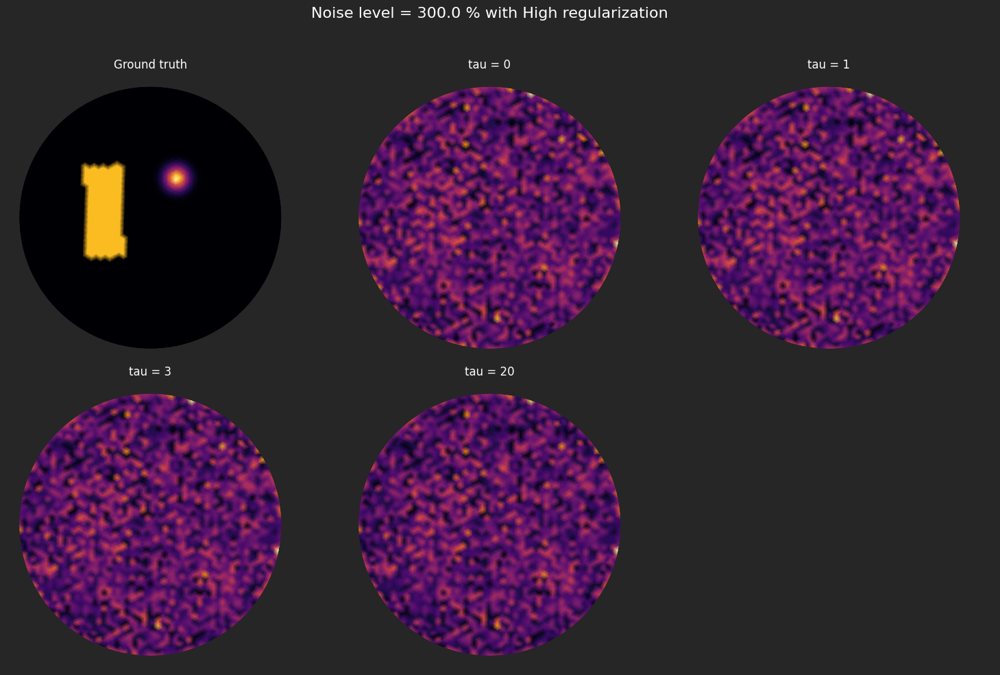

In [ ]:
tau_array = [0, 1, 3, 20]
noise_levels = [0.0, 0.1,0.3, 1.0, 3.0]  # percentage-based noise level
alpha_text = ['High regularization', 'Medium regularization', 'Low regularization']

for i_alpha in range(len(alphas)):
    alpha = alphas[i_alpha]
    for i_noise, noise_level in enumerate(noise_levels):

        # --- add noise to y_cp ---
        if noise_level == 0.0:
            y_noisy_cp = y_cp.copy()
        else:
            noise_cp = noise_level * cp.linalg.norm(y_cp) * cp.random.randn(*y_cp.shape) / cp.sqrt(cp.prod(cp.array(y_cp.shape)))
            y_noisy_cp = y_cp + noise_cp

        fig, axes = plt.subplots(2, 3, figsize=(15, 10))
        fig.patch.set_facecolor("0.15")

        cmap = "inferno"

        # --- ground truth ---
        ax = axes[0, 0]
        ax.tripcolor(triang, np.abs(x), shading="gouraud", cmap=cmap)
        ax.set_title("Ground truth", color="white")
        ax.set_aspect("equal")
        ax.axis("off")
        ax.set_facecolor("0.15")

        # --- reconstructions ---
        for i, tau in enumerate(tau_array):
            row = (i + 1) // 3
            col = (i + 1) % 3

            x_rec_cp, _ = svd_tikhonov_reconstruct(
                y_cp=y_noisy_cp, alpha=alpha, tau=tau,
                U_cp=U_cp, S_cp=S_cp, Vh_cp=Vh_cp
            )
            x_rec = cp.asnumpy(x_rec_cp)

            ax = axes[row, col]
            ax.tripcolor(triang, np.abs(x_rec), shading="gouraud", cmap=cmap)
            ax.set_title(f"tau = {tau}", color="white")
            ax.set_aspect("equal")
            ax.axis("off")
            ax.set_facecolor("0.15")

        # hide unused panel
        axes[1, 2].axis("off")
        axes[1, 2].set_facecolor("0.15")

        # --- global title with noise level ---
        fig.suptitle(f"Noise level = {noise_level*100:.1f} %" + " with " + alpha_text[i_alpha], color="white", fontsize=16)

        plt.tight_layout(rect=[0, 0, 1, 0.95])
        plt.show()



# include the code. White background, tau=\tau, include the sigmas. 
# Make the nonconstant inclusion larger, show one more tau (higher), one where wee see gibbs phenomenon. 
# Look through a few more parameter choises (k-values) one that makes the problem slightly more difficult. Make the grid a little finer. Upload the code to github, fix the license. 
# Describe the ISP. Fix high/low regularization title (actually, put that in description)

